In [1]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Polygon, Rectangle
from matplotlib.animation import FuncAnimation
plt.rcParams["animation.html"] = "jshtml"


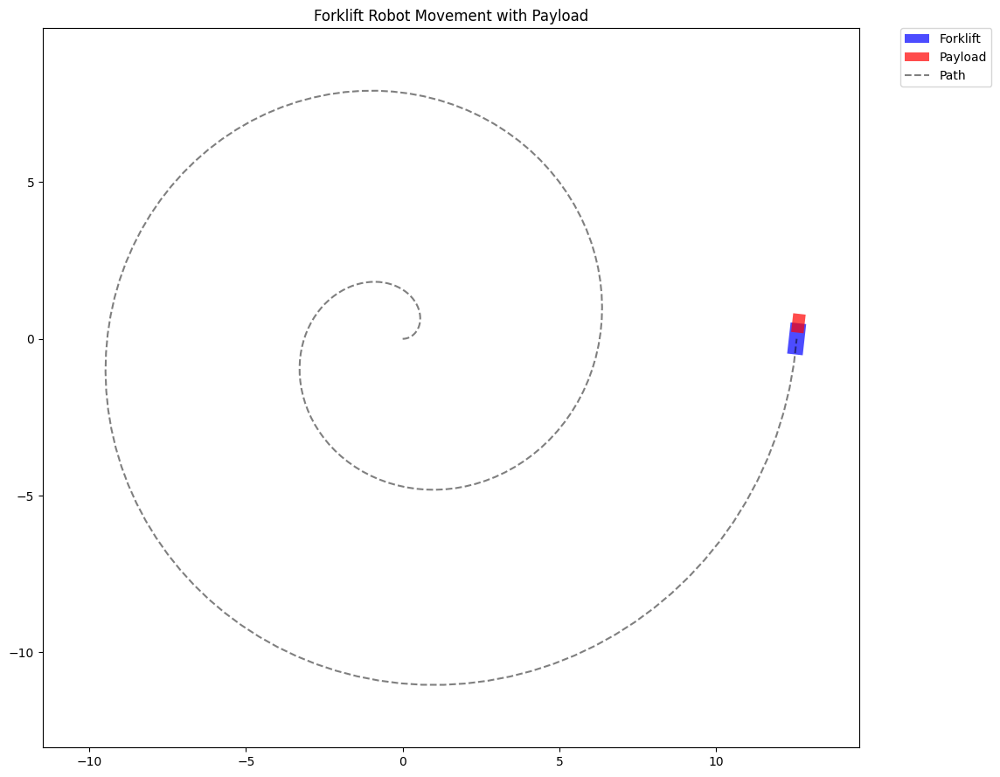

In [2]:

# Define the robot and payload parameters
ROBOT_WIDTH = 0.5
ROBOT_LENGTH = 1.0
PAYLOAD_OFFSET = (0.5, 0)  # Offset from the robot's center
PAYLOAD_VERTICES = np.array([[-0.3, -0.2], [0.3, -0.2], [0.3, 0.2], [-0.3, 0.2]])

def create_robot_polygon(x, y, theta):
    corners = np.array([
        [-ROBOT_LENGTH/2, -ROBOT_WIDTH/2],
        [ROBOT_LENGTH/2, -ROBOT_WIDTH/2],
        [ROBOT_LENGTH/2, ROBOT_WIDTH/2],
        [-ROBOT_LENGTH/2, ROBOT_WIDTH/2]
    ])
    rotation_matrix = np.array([
        [np.cos(theta), -np.sin(theta)],
        [np.sin(theta), np.cos(theta)]
    ])
    rotated_corners = np.dot(corners, rotation_matrix.T)
    return rotated_corners + [x, y]

def create_payload_polygon(x, y, theta):
    offset_x, offset_y = PAYLOAD_OFFSET
    rotation_matrix = np.array([
        [np.cos(theta), -np.sin(theta)],
        [np.sin(theta), np.cos(theta)]
    ])
    rotated_offset = np.dot(rotation_matrix, [offset_x, offset_y])
    rotated_vertices = np.dot(PAYLOAD_VERTICES, rotation_matrix.T)
    return rotated_vertices + [x + rotated_offset[0], y + rotated_offset[1]]

# Generate a winding path
t = np.linspace(0, 4*np.pi, 200)
path_x = t * np.cos(t)
path_y = t * np.sin(t)

# Set up the figure and axis
fig, ax = plt.subplots(figsize=(12, 10))
ax.set_xlim(min(path_x) - 2, max(path_x) + 2)
ax.set_ylim(min(path_y) - 2, max(path_y) + 2)
ax.set_aspect('equal')

# Initialize the robot and payload
robot = Polygon(create_robot_polygon(path_x[0], path_y[0], 0), fc='b', alpha=0.7)
payload = Polygon(create_payload_polygon(path_x[0], path_y[0], 0), fc='r', alpha=0.7)
ax.add_patch(robot)
ax.add_patch(payload)

# Plot the path
path_line, = ax.plot(path_x, path_y, 'k--', alpha=0.5)

# Create legend elements
legend_forklift = Rectangle((0, 0), 1, 1, fc='b', alpha=0.7)
legend_payload = Rectangle((0, 0), 1, 1, fc='r', alpha=0.7)

# Add legend
ax.legend([legend_forklift, legend_payload, path_line],
          ['Forklift', 'Payload', 'Path'],
          loc='upper left', bbox_to_anchor=(1.05, 1), borderaxespad=0.)

# Adjust layout to make room for the legend
plt.tight_layout()
fig.subplots_adjust(right=0.8)

# Animation update function
def update(frame):
    x, y = path_x[frame], path_y[frame]
    if frame > 0:
        dx, dy = x - path_x[frame-1], y - path_y[frame-1]
        theta = np.arctan2(dy, dx)
    else:
        theta = 0
    
    robot.set_xy(create_robot_polygon(x, y, theta))
    payload.set_xy(create_payload_polygon(x, y, theta))
    return robot, payload

# Create the animation
anim = FuncAnimation(fig, update, frames=len(t), interval=50, blit=True)

plt.title("Forklift Robot Movement with Payload")

from IPython.display import HTML
HTML(anim.to_jshtml())

anim